In [1]:
from music21 import *
import os
import json
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import normalize

path = 'plots' ## path to the folder for the plots
makamDistribution = 'makam-distributions.json' ## Path to the json file of data
makamScoreDirectory = '../SymbTr-2.4.3/MusicXML/' ### Dataset should be at the parent directory

In [ ]:
with open(makamDistribution) as json_file:
    data = json.load(json_file)
    for makam in data.keys():
        for i, form in enumerate(data[makam]['forms']):
            #print(data[makam]['forms'][form])
            keys = np.fromiter(data[makam]['forms'][form].keys(), dtype='U20')
            vals = np.fromiter(data[makam]['forms'][form].values(), dtype=float)
            try:
                os.makedirs(path+'/forms/'+makam)
            except OSError:
                print ("Creation of the directory %s failed" % path)
            else:
                print ("Successfully created the directory %s" % path)
            plt.figure()
            plt.bar(keys,vals)
            plt.xticks(rotation=90)
            plt.xlabel("Pitch Classes")
            plt.ylabel("Count")
            plt.title('makam:'+makam+'-form:'+form)
            plt.savefig(path+'/forms/'+makam+'/'+form+'.png')

            


In [ ]:
with open(makamDistribution) as json_file:
    data = json.load(json_file)
    for makam in data.keys():
        for i, usul in enumerate(data[makam]['usuls']):
            #print(data[makam]['forms'][form])
            keys = np.fromiter(data[makam]['usuls'][usul].keys(), dtype='U20')
            vals = np.fromiter(data[makam]['usuls'][usul].values(), dtype=float)
            try:
                os.makedirs(path+'/usuls/'+makam)
            except OSError:
                print ("Creation of the directory %s failed" % path)
            else:
                print ("Successfully created the directory %s" % path)
            plt.figure()
            plt.bar(keys,vals)
            plt.xticks(rotation=90)
            plt.xlabel("Pitch Classes")
            plt.ylabel("Count")
            plt.title('makam:'+makam+'-usul:'+usul)
            plt.savefig(path+'/usuls/'+makam+'/'+usul+'.png')


<ipython-input-4-1119fc91b3af>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


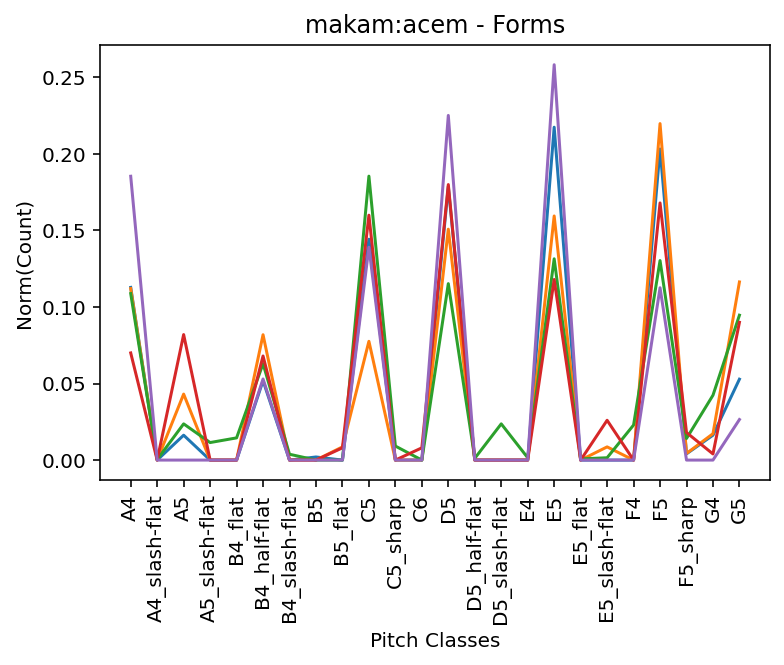

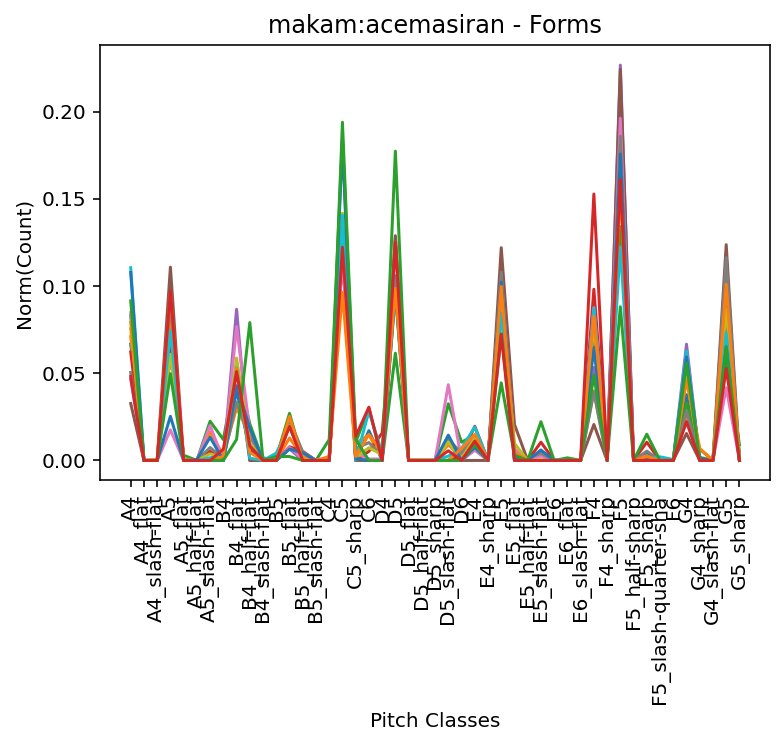

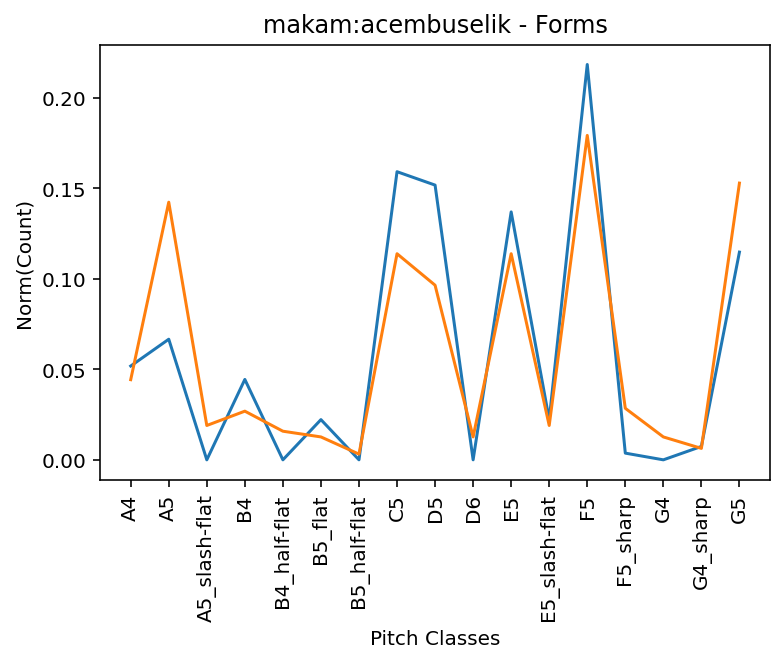

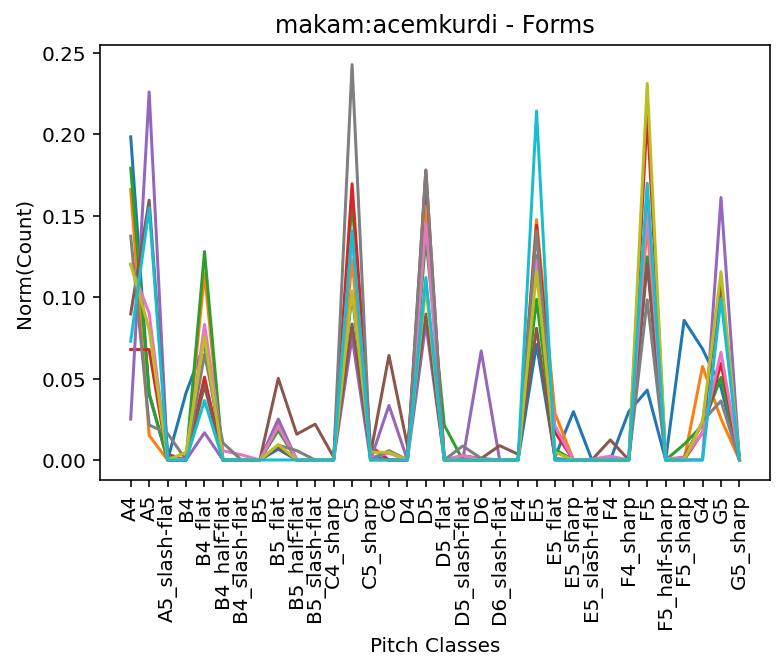

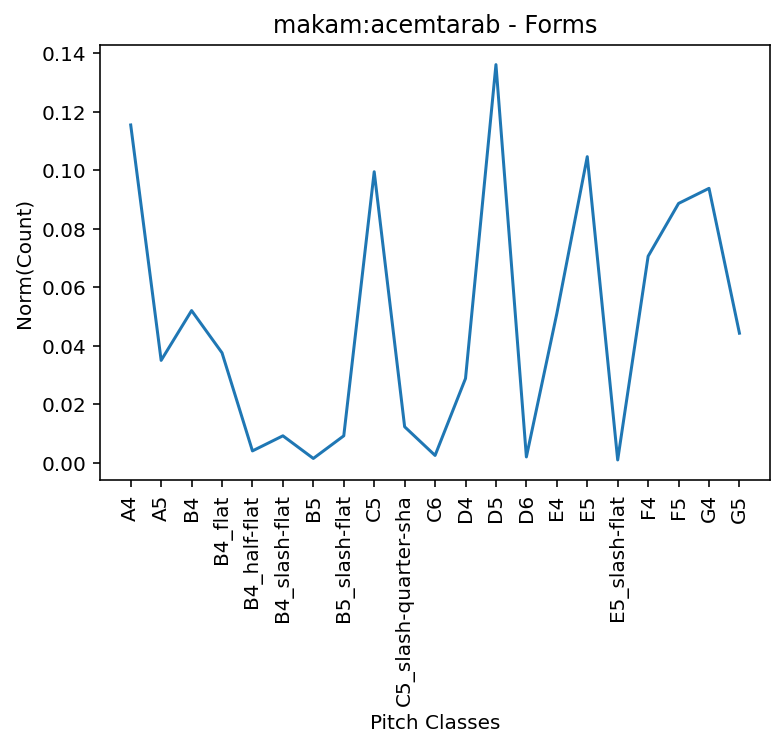

...

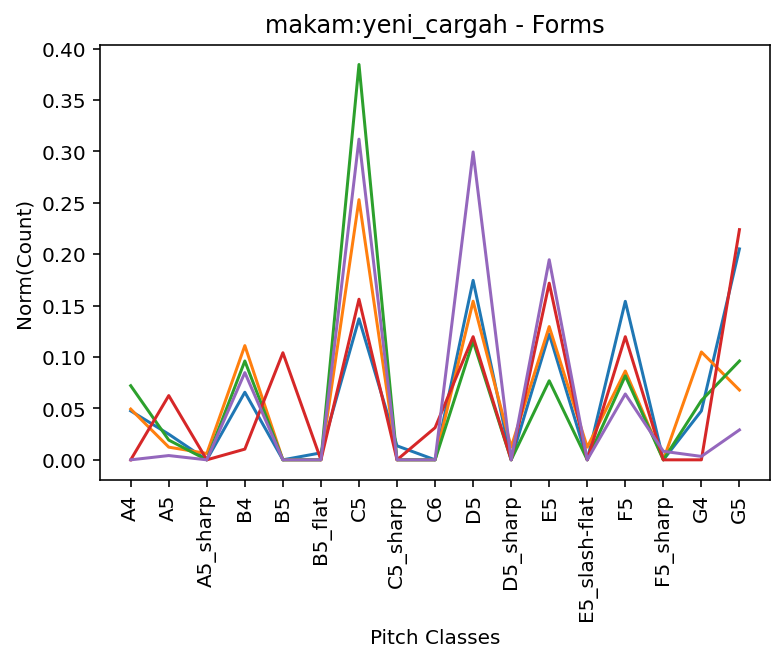

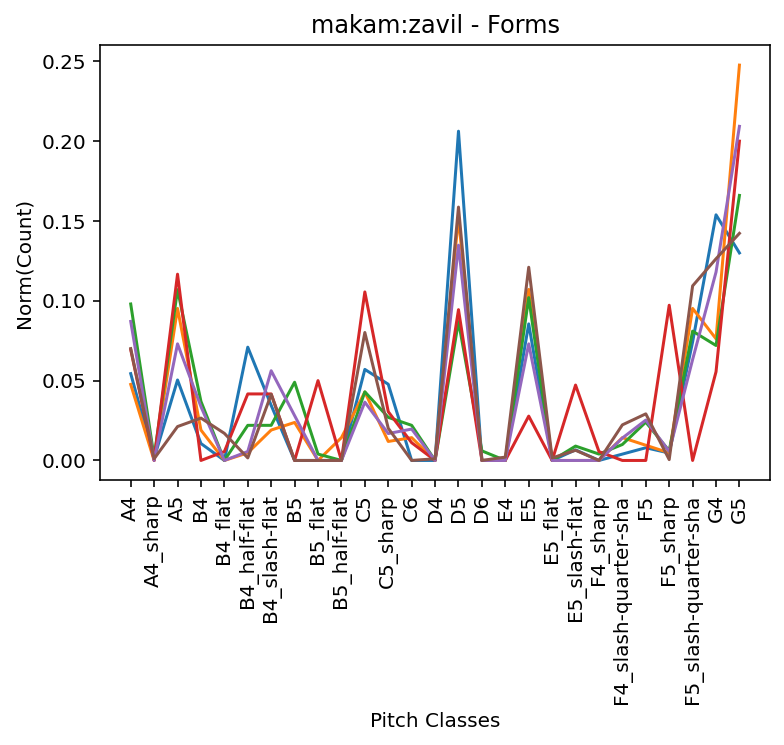

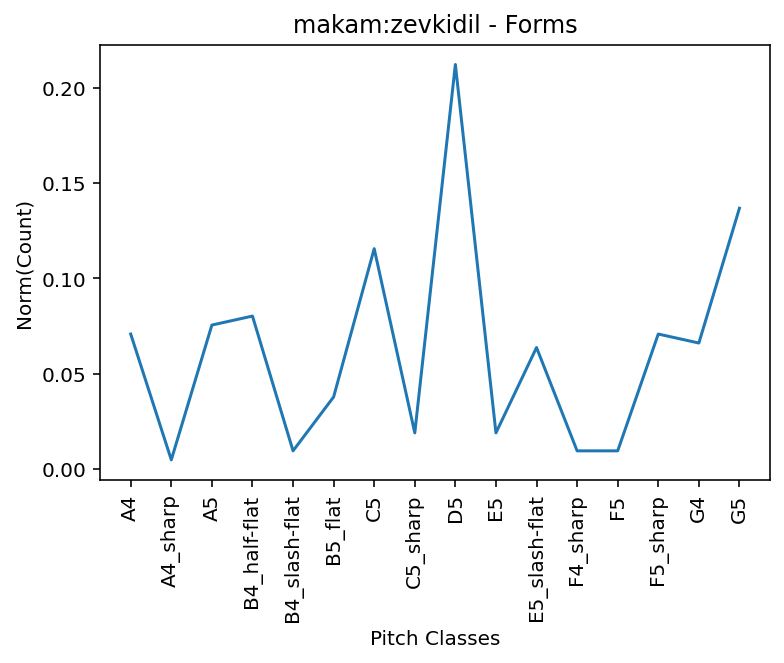

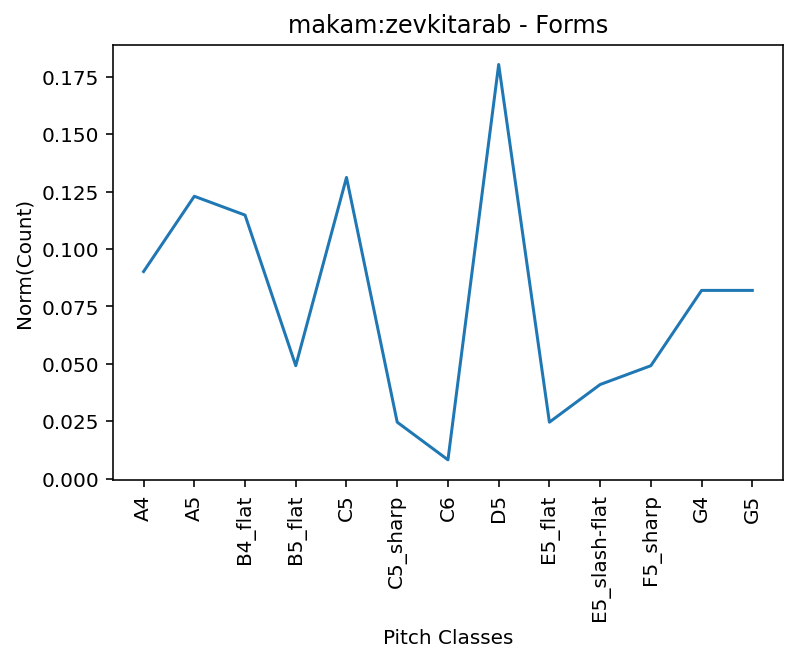

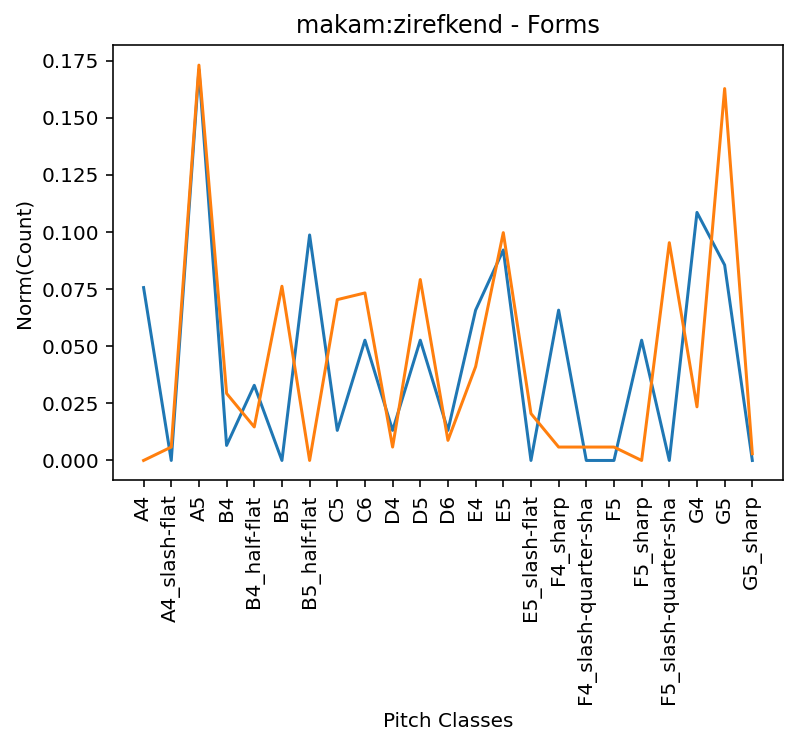

In [4]:

with open(makamDistribution) as json_file:
    data = json.load(json_file)
    for makam in data.keys():
        plt.figure()
        plt.xticks(rotation=90)
        plt.xlabel("Pitch Classes")
        plt.ylabel("Norm(Count)")
        tmp_keys = []
        tmp_vals = []
        forms = []
        for i, form in enumerate(data[makam]['forms']):
            #print(data[makam]['forms'][form])
            keys = np.fromiter(data[makam]['forms'][form].keys(), dtype='U20')
            vals = np.fromiter(data[makam]['forms'][form].values(), dtype=float)
            tmp_keys.append(keys)
            tmp_vals.append(vals)
            forms.append(form)
        list_of_keys, vals_norm = set_up_data(tmp_keys,tmp_vals)
        plt.title('makam:'+makam+' - Forms')
        for k in range(len(vals_norm)):
            plt.plot(list_of_keys,vals_norm[k])

In [2]:
def set_up_data(keys,vals):
    flat_list = [item for sublist in keys for item in sublist]
    list_of_keys = np.sort(list(dict.fromkeys(flat_list)))
    tmp = []
    for i in range(len(vals)):
        tmp_vals = []
        sort_vals=np.zeros(len(vals[i]))
        sort_keys = np.sort(keys[i])
        sort_index = np.argsort(keys[i]) 
        for j in range(len(vals[i])):
            sort_vals[j] = vals[i][sort_index[j]]
        for k in range(len(list_of_keys)):
            if list_of_keys[k] in sort_keys:
                tmp_vals.append(sort_vals[np.where(sort_keys == list_of_keys[k])])
            else:
                tmp_vals.append(0)
        tmp.append(tmp_vals)

    vals_norm = [[i / sum(j) for i in j] for j in tmp]
    
    return list_of_keys, vals_norm
    
    